In [25]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [26]:
def remove_collinear_features(x, threshold):
    """
    Objective:
        Remove collinear features in a dataframe with a correlation coefficient
        greater than the threshold. Removing collinear features can help a model
        to generalize and improves the interpretability of the model.

    Inputs:
        x: features dataframe
        threshold: features with correlations greater than this value are removed

    Output:
        dataframe that contains only the non-highly-collinear features
    """

    # Calculate the correlation matrix
    corr_matrix = x.corr()
    iters = range(len(corr_matrix.columns) - 1)
    drop_cols = []

    # Iterate through the correlation matrix and compare correlations
    for i in iters:
        for j in range(i + 1):
            item = corr_matrix.iloc[j : (j + 1), (i + 1) : (i + 2)]
            col = item.columns
            row = item.index
            val = abs(item.values)

            # If correlation exceeds the threshold
            if val >= threshold:
                # Print the correlated features and the correlation value
                # print(col.values[0], "|", row.values[0], "|", round(val[0][0], 2))
                drop_cols.append(col.values[0])

    # Drop one of each pair of correlated columns
    drops = set(drop_cols)
    x = x.drop(columns=drops)
    print("Removed Columns {}".format(drops))
    return x

# aids

In [23]:
aids = pd.read_csv(
    "https://raw.githubusercontent.com/Fersoil/logistic_regression/preprocessing_data/data/aids.csv?token=GHSAT0AAAAAACIBN357PEUWXRFLYLR5F5UMZPZS3JA"
)

In [13]:
# one distinct value in the column zprior
aids = aids.drop(columns=["zprior"])

In [14]:
# raname column cid to target
aids = aids.rename(columns={"cid": "target"})

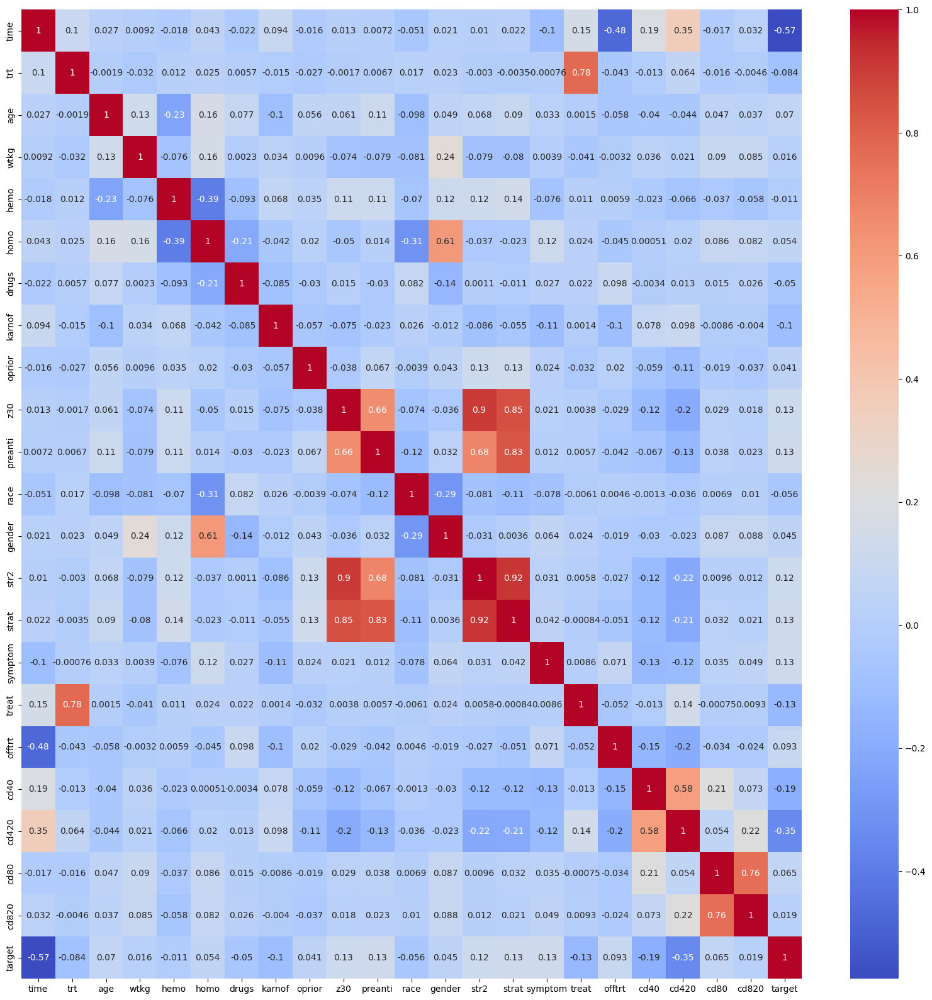

In [18]:
# make corr heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(aids.corr(), annot=True, cmap="coolwarm")
plt.show()


In [19]:
aids = remove_collinear_features(aids, 0.8)

Removed Columns {'strat', 'str2'}


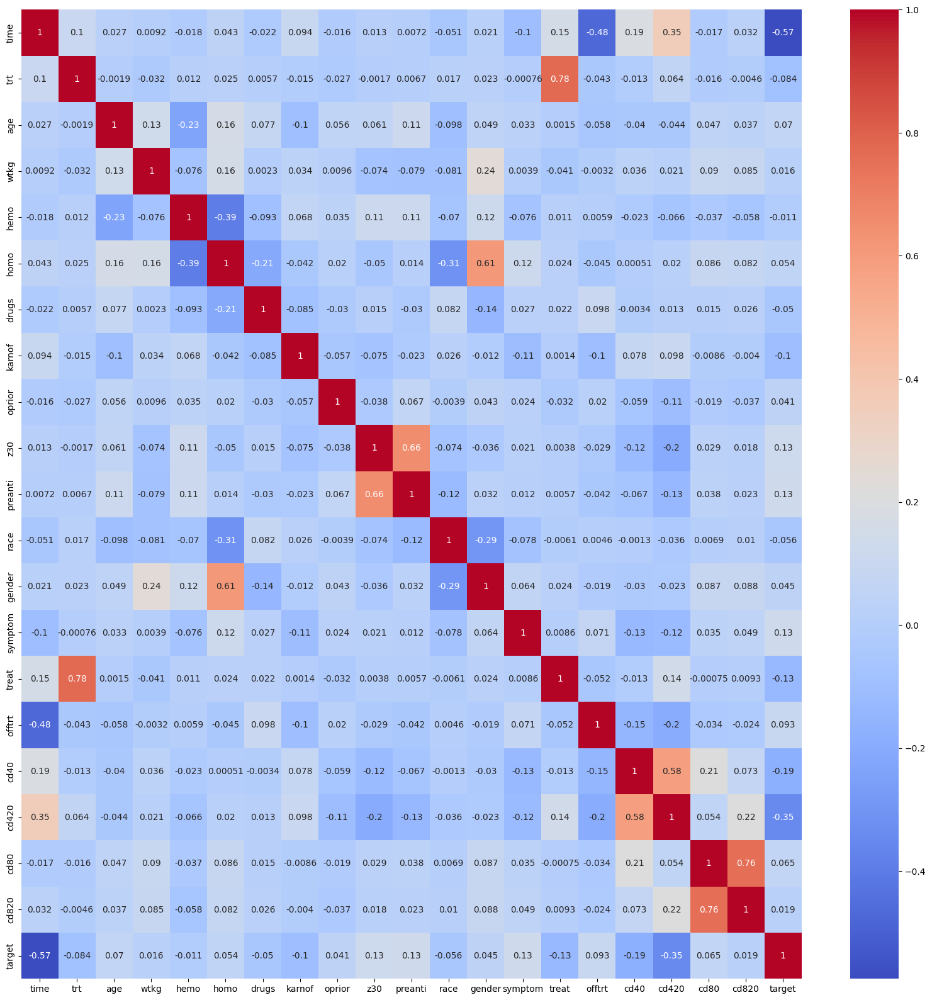

In [20]:
# make corr heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(aids.corr(), annot=True, cmap="coolwarm")
plt.show()

In [22]:
aids.to_csv("data/aids.csv", index=False)

# blood

In [19]:
blood = pd.read_csv("https://raw.githubusercontent.com/Fersoil/logistic_regression/preprocessing_data/data/blood.csv?token=GHSAT0AAAAAACIBN357UVLNV4V2V3RXOS46ZPZTAOQ")

In [24]:
blood = blood.rename(columns={"y": "target"})

,V1,V2,V3,V4,target
0,2.0,50.0,12500.0,98.0,1
1,0.0,13.0,3250.0,28.0,1
2,1.0,16.0,4000.0,35.0,1
3,2.0,20.0,5000.0,45.0,1
4,1.0,24.0,6000.0,77.0,0
...,...,...,...,...,...
743,23.0,2.0,500.0,38.0,0
744,21.0,2.0,500.0,52.0,0
745,23.0,3.0,750.0,62.0,0
746,39.0,1.0,250.0,39.0,0


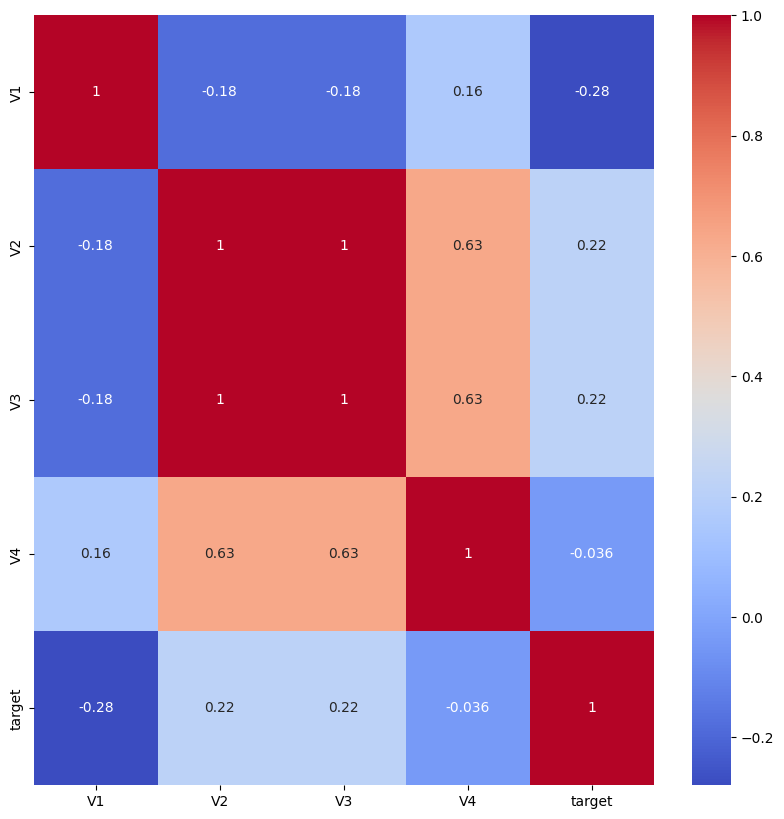

In [26]:
# make corr heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(blood.corr(), annot=True, cmap="coolwarm")
plt.show()

In [27]:
# values v2 and v3 have correlation of 1
blood.drop(columns=["V2"], inplace=True)

In [28]:
blood.to_csv("data/blood.csv", index=False)

# campaign

In [30]:
campaign = pd.read_csv(
    "https://raw.githubusercontent.com/Fersoil/logistic_regression/preprocessing_data/data/campaign.csv?token=GHSAT0AAAAAACIBN3575APUJ2QSYTUNSL3YZPZTGIQ"
)

In [32]:
campaign.rename(columns={"Response": "target"}, inplace=True)

In [38]:
# only one distinct value in Z_CostContact and Z_Revenue
campaign.drop(columns=["Z_CostContact", "Z_Revenue"], inplace=True)

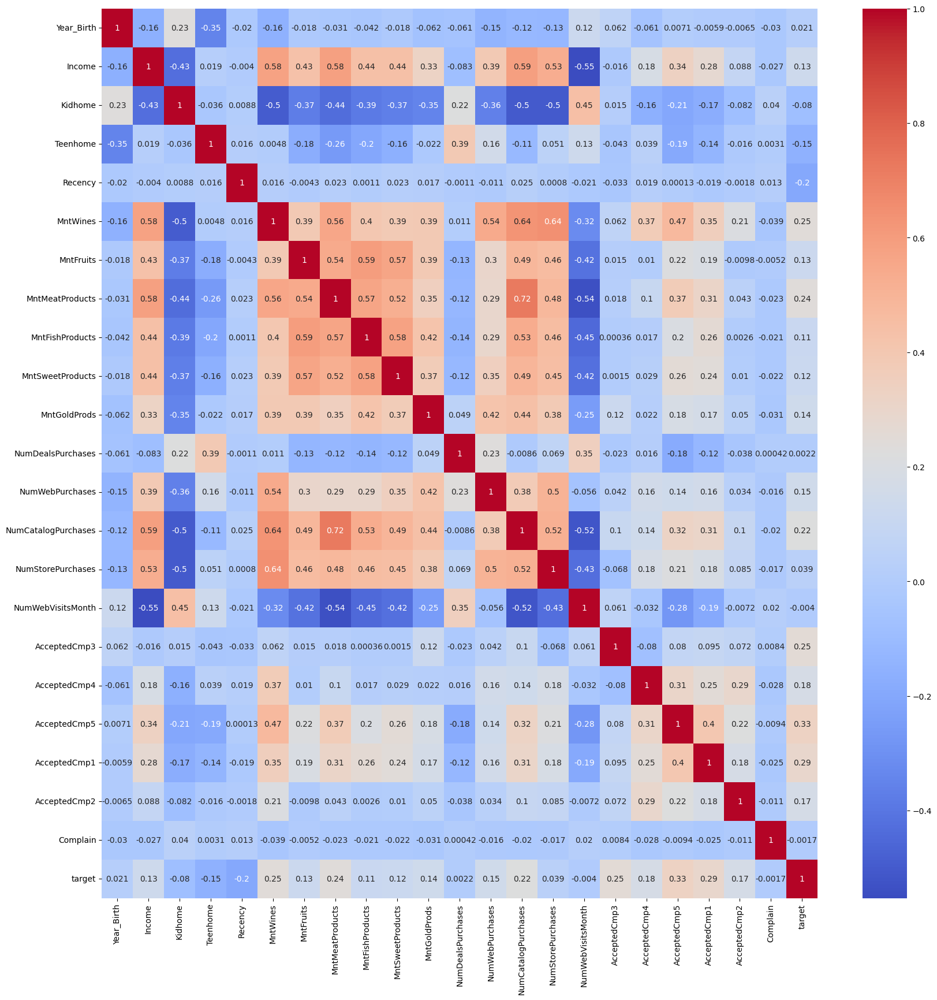

In [39]:
# make corr heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(campaign.corr(), annot=True, cmap="coolwarm")
plt.show()

In [40]:
campaign.to_csv("data/campaign.csv", index=False)

# communities and crime 

In [30]:
communities = pd.read_csv("https://raw.githubusercontent.com/Fersoil/logistic_regression/preprocessing_data/data/communities_and_crime.csv?token=GHSAT0AAAAAACIBN357PQJRY7PLI3UQWLGYZPZTP3Q")

In [34]:
communities.rename(columns={"target_ViolentCrimesPerPop": "target"}, inplace=True)
communities.drop(columns=["state", "communityname"], inplace=True)

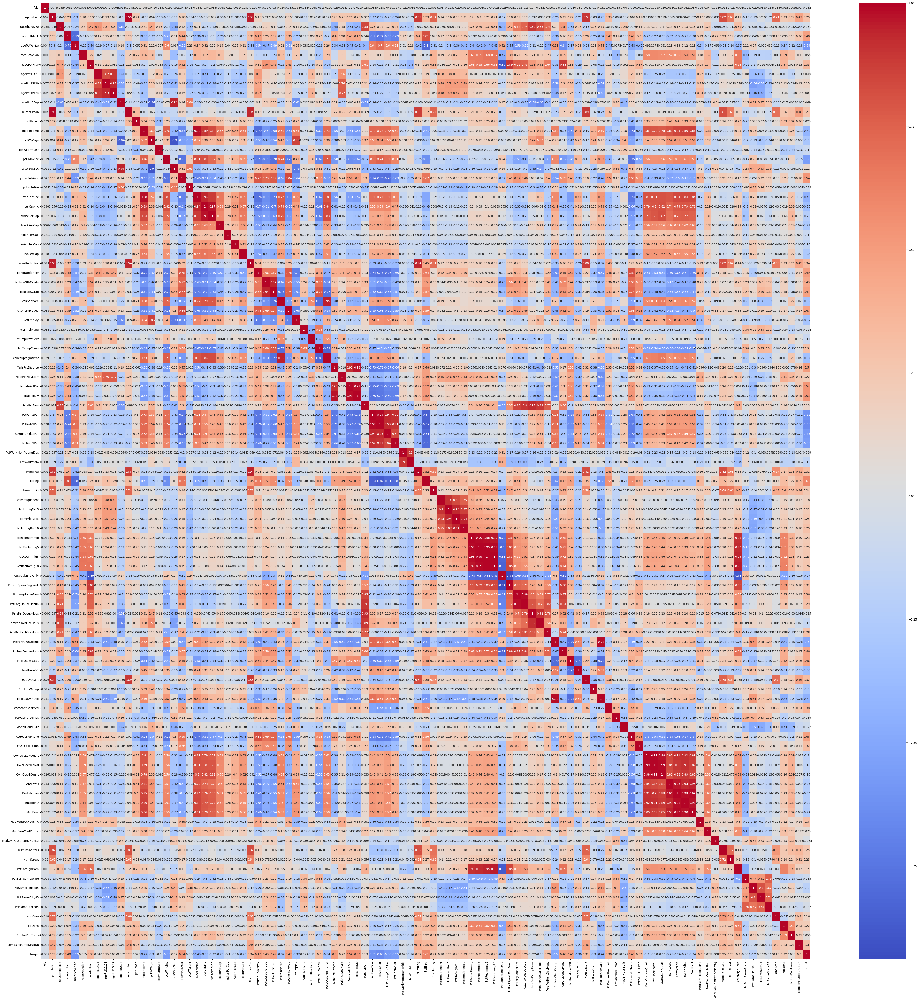

In [35]:
# make corr heatmap
plt.figure(figsize=(60, 60))
sns.heatmap(communities.corr(), annot=True, cmap="coolwarm")
plt.show()

In [36]:
communities = remove_collinear_features(communities, threshold=0.8)

Removed Columns {'PctImmigRec8', 'MedRent', 'PctIlleg', 'PersPerFam', 'PersPerRentOccHous', 'PctPersDenseHous', 'numbUrban', 'OwnOccMedVal', 'PctLargHouseOccup', 'PctRecImmig5', 'NumUnderPov', 'PctTeen2Par', 'PctRecImmig10', 'OwnOccLowQuart', 'PctUnemployed', 'PctYoungKids2Par', 'TotalPctDiv', 'pctWWage', 'PctRecImmig8', 'OwnOccHiQuart', 'agePct12t29', 'PctForeignBorn', 'NumInShelters', 'PctOccupMgmtProf', 'HousVacant', 'PctEmploy', 'PctNotHSGrad', 'PctHousNoPhone', 'RentHighQ', 'whitePerCap', 'NumIlleg', 'PctSpeakEnglOnly', 'perCapInc', 'PctSameCity85', 'PctImmigRec10', 'PctNotSpeakEnglWell', 'medFamInc', 'PctImmigRec5', 'PersPerOwnOccHous', 'PctKids2Par', 'PctWorkMom', 'PctLargHouseFam', 'RentLowQ', 'FemalePctDiv', 'PersPerOccupHous', 'RentMedian', 'pctWSocSec', 'PctHousOwnOcc', 'agePct16t24'}


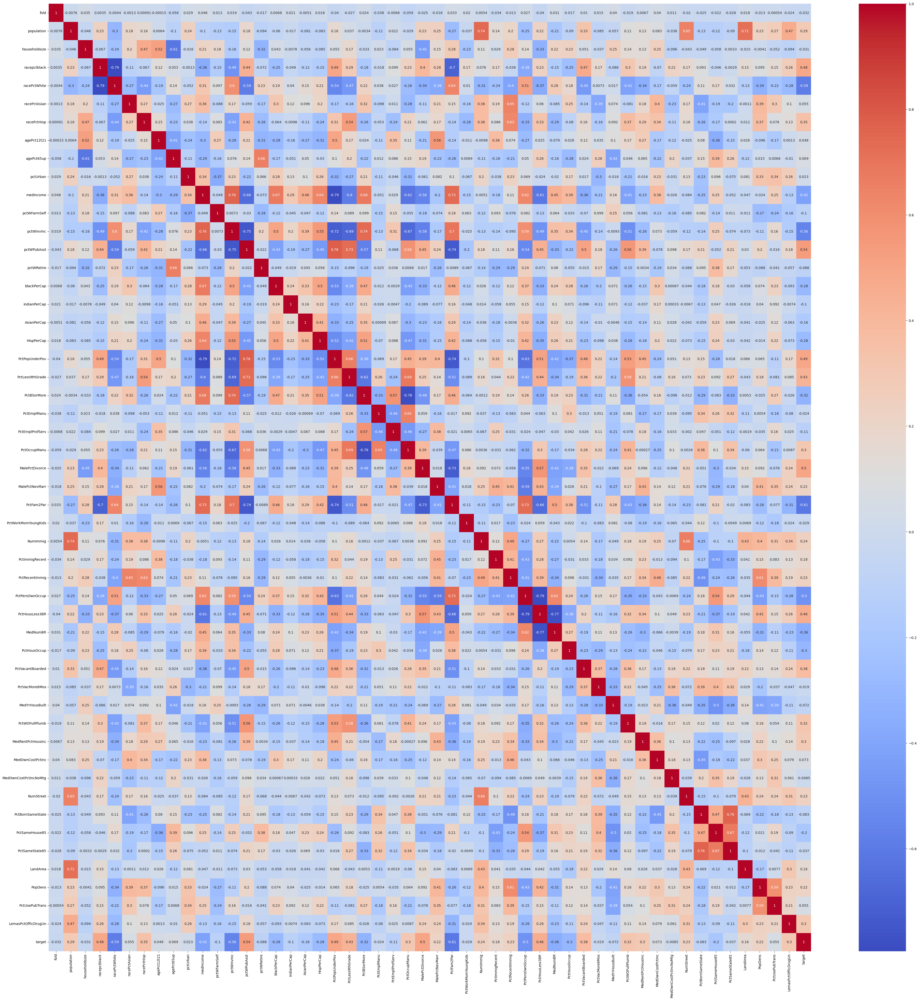

In [37]:
# make corr heatmap
plt.figure(figsize=(50, 50))
sns.heatmap(communities.corr(), annot=True, cmap="coolwarm")
plt.show()

In [39]:
communities.to_csv("data/communities_and_crime.csv", index=False)

# diabetes

In [3]:
diabetes = pd.read_csv(
    "https://raw.githubusercontent.com/Fersoil/logistic_regression/preprocessing_data/data/diabetes.csv?token=GHSAT0AAAAAACIBN356XRNGJJVJ7RS32QUEZP3IM4A"
)

In [6]:
diabetes.rename(columns={"y": "target"}, inplace=True)

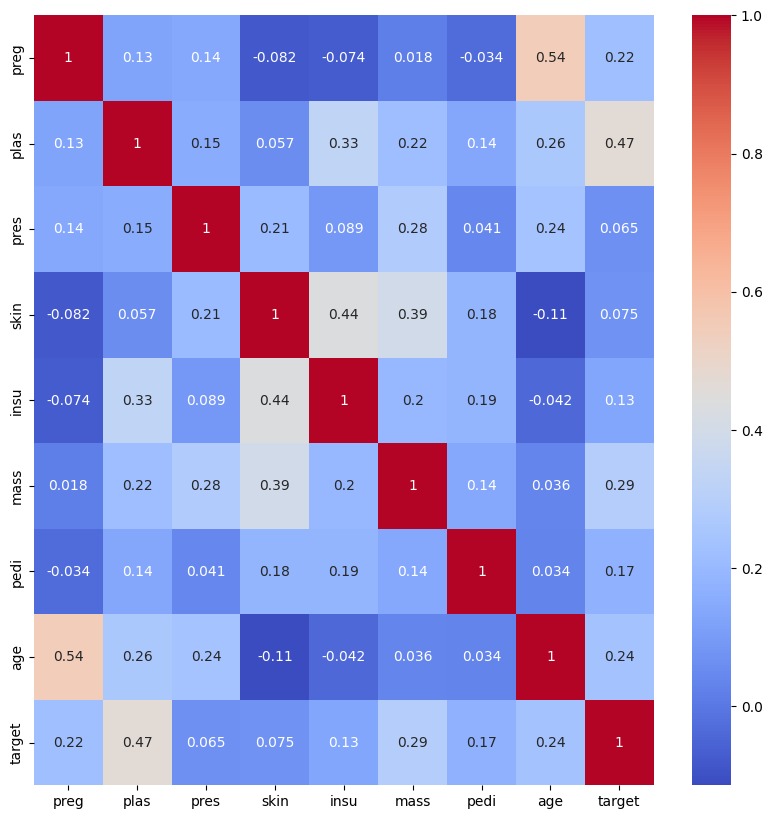

In [7]:
plt.figure(figsize=(10, 10))
sns.heatmap(diabetes.corr(), annot=True, cmap="coolwarm")
plt.show()

In [8]:
diabetes.to_csv("data/diabetes.csv", index=False)

# Dry bean

In [47]:
dry_bean = pd.read_csv("https://raw.githubusercontent.com/Fersoil/logistic_regression/preprocessing_data/data/dry_bean.csv?token=GHSAT0AAAAAACIBN35776DDSKBR5TKI3LTQZP3IQOA")

In [48]:
dry_bean
dry_bean.rename(columns={"y": "target"}, inplace=True)

In [49]:
dry_bean

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,target
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,1
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,1
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,1
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,1
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,1
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,1
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,1
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653247,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,1


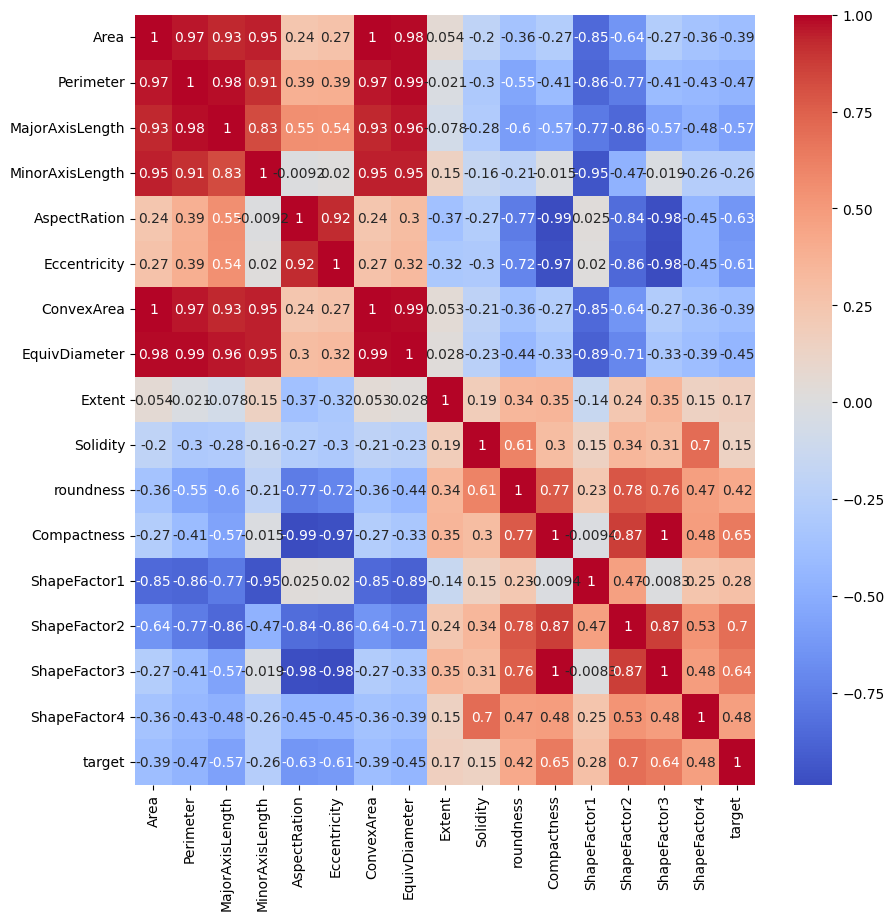

In [50]:
plt.figure(figsize=(10, 10))
sns.heatmap(dry_bean.corr(), annot=True, cmap="coolwarm")
plt.show()

In [51]:
dry_bean = remove_collinear_features(dry_bean, threshold=0.9)

Removed Columns {'Compactness', 'ShapeFactor1', 'Eccentricity', 'MajorAxisLength', 'EquivDiameter', 'ConvexArea', 'Perimeter', 'ShapeFactor3', 'MinorAxisLength'}


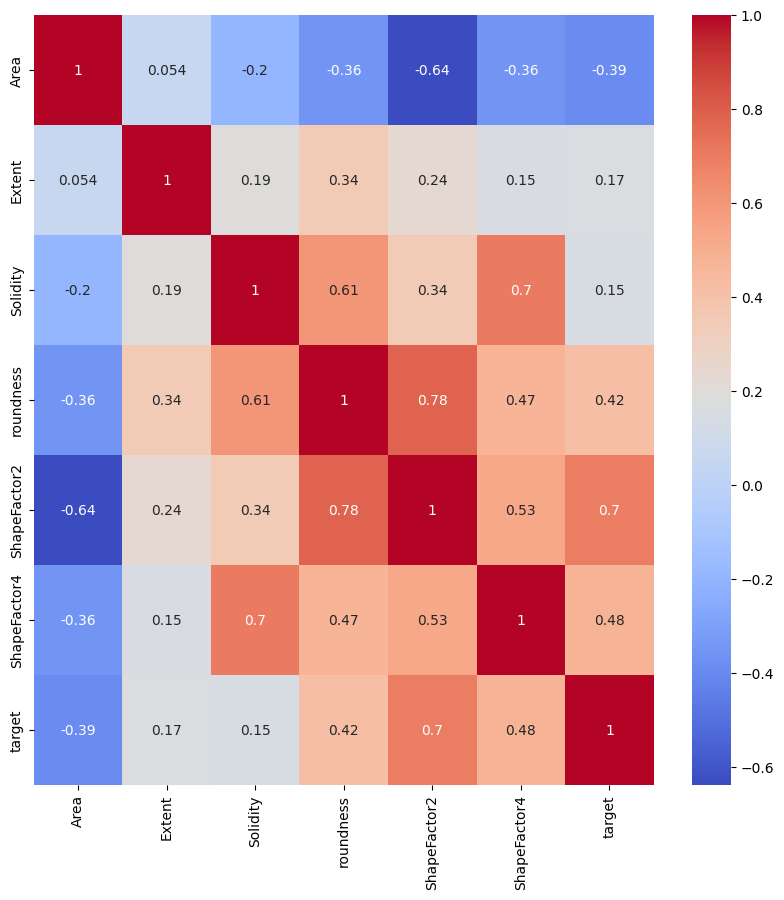

In [54]:
plt.figure(figsize=(10, 10))
sns.heatmap(dry_bean.corr(), annot=True, cmap="coolwarm")
plt.show()

In [53]:
dry_bean = dry_bean.drop(columns=["AspectRation"])

In [55]:
dry_bean.to_csv("data/dry_bean.csv", index=False)

# heart

In [56]:
heart = pd.read_csv("https://raw.githubusercontent.com/Fersoil/logistic_regression/preprocessing_data/data/heart.csv?token=GHSAT0AAAAAACIBN35772SR6MR7Q5ZMSGBYZP3JUWQ")

In [57]:
heart

,HeartDiseaseorAttack,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,Diabetes,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,0.0,1.0,1.0,1.0,45.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,5.0,0.0,1.0,5.0,6.0,7.0
253676,0.0,1.0,1.0,1.0,18.0,0.0,0.0,2.0,0.0,0.0,...,1.0,0.0,4.0,0.0,0.0,1.0,0.0,11.0,2.0,4.0
253677,0.0,0.0,0.0,1.0,28.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,5.0,2.0
253678,0.0,1.0,0.0,1.0,23.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,7.0,5.0,1.0


In [58]:
heart.rename(columns={"HeartDiseaseorAttack": "target"}, inplace=True)

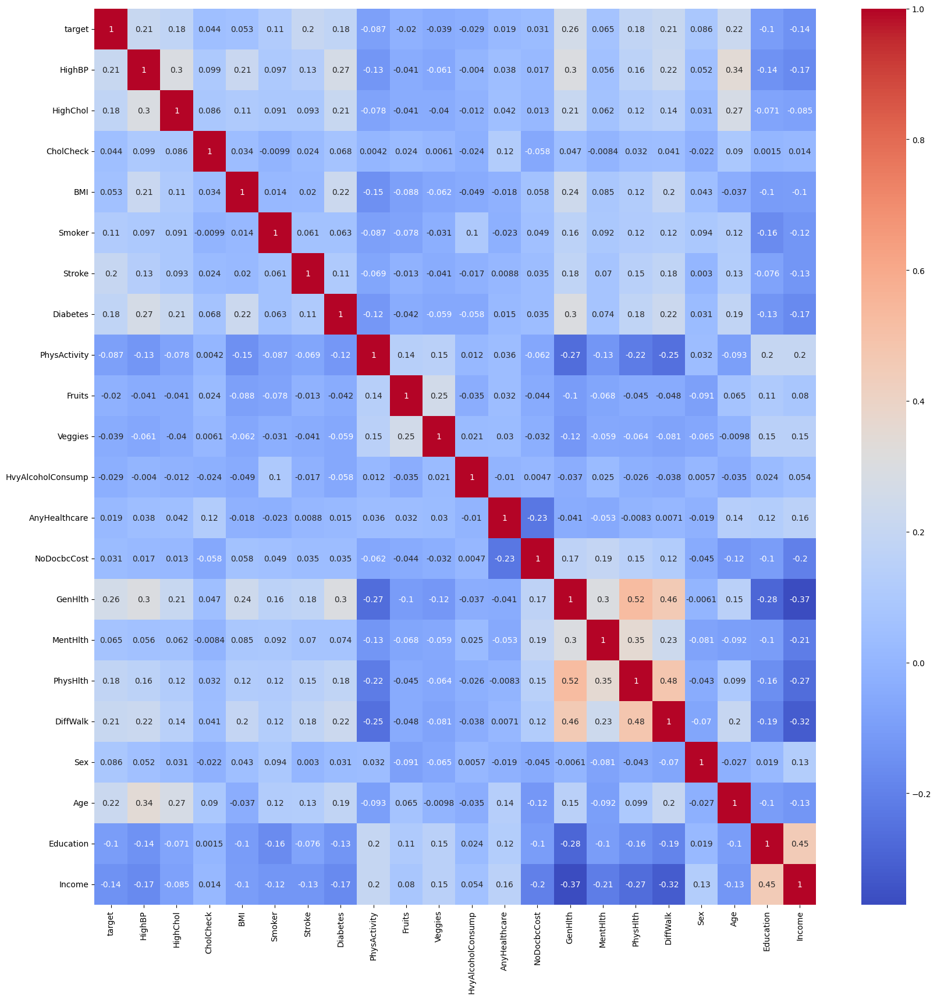

In [60]:
plt.figure(figsize=(20, 20))
sns.heatmap(heart.corr(), annot=True, cmap="coolwarm")
plt.show()

In [61]:
heart.to_csv("data/heart.csv", index=False)

# phishing 

In [69]:
phishing = pd.read_csv(
    "https://raw.githubusercontent.com/Fersoil/logistic_regression/preprocessing_data/data/phishing.csv?token=GHSAT0AAAAAACIBN357CNLMXC4L4VFSEX6UZP3JYFQ"
)

In [70]:
phishing.rename(columns={"phishing": "target"}, inplace=True)

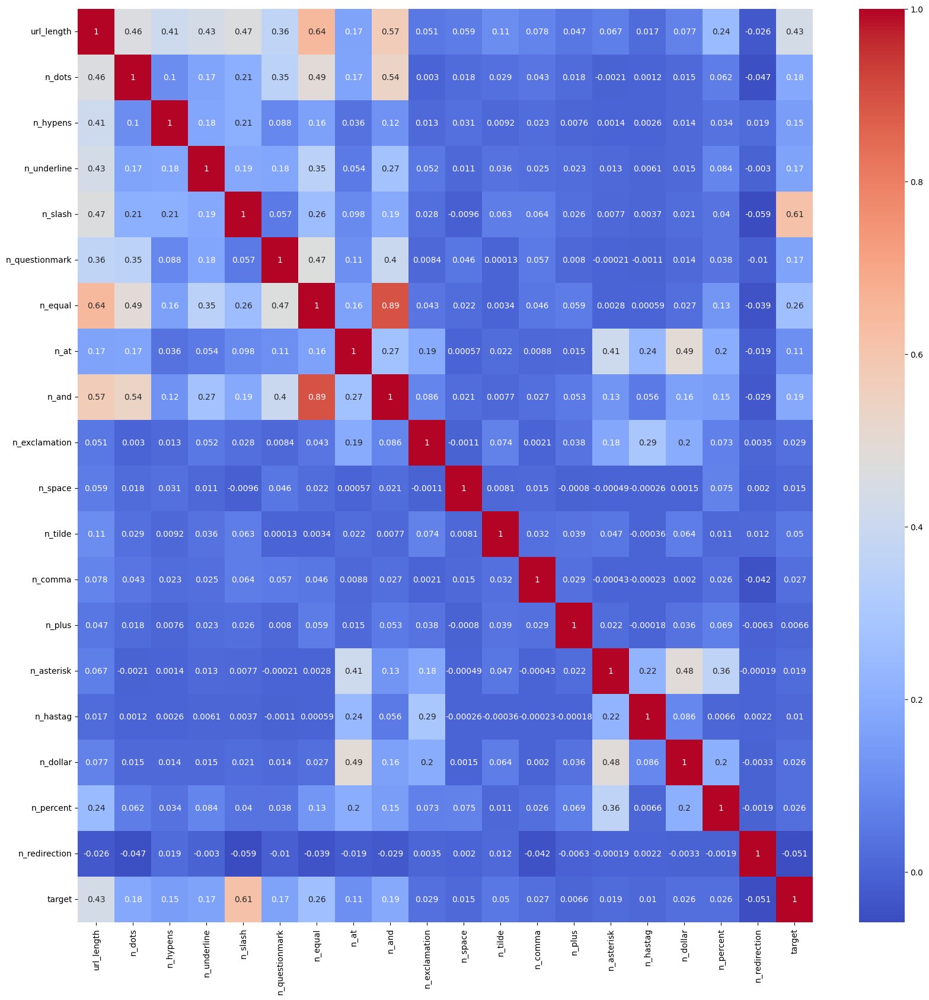

In [71]:
plt.figure(figsize=(20, 20))
sns.heatmap(phishing.corr(), annot=True, cmap="coolwarm")
plt.show()

In [72]:
phishing.drop(columns=["n_and"], inplace=True)

In [73]:
phishing.to_csv("data/phishing.csv", index=False)

# polish companies 

In [74]:
polish_companies = pd.read_csv("https://raw.githubusercontent.com/Fersoil/logistic_regression/preprocessing_data/data/polish_companies_bankruptcy.csv?token=GHSAT0AAAAAACIBN356M6O5KYUMYTRLA6R2ZP3J3CQ")

In [76]:
polish_companies.rename(columns={"class": "target"}, inplace=True)

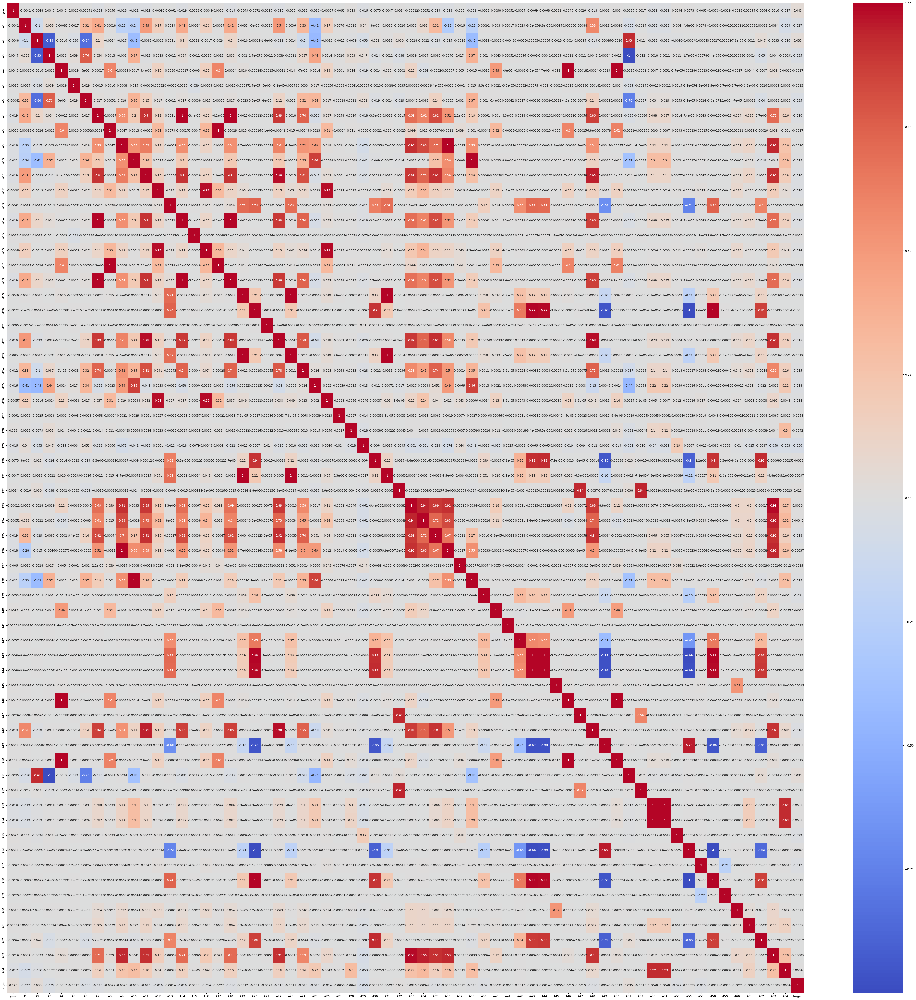

In [78]:
plt.figure(figsize=(60, 60))
sns.heatmap(polish_companies.corr(), annot=True, cmap="coolwarm")
plt.show()

In [79]:
polish_companies = remove_collinear_features(polish_companies, threshold=0.8)

Removed Columns {'A54', 'A26', 'A43', 'A31', 'A33', 'A16', 'A62', 'A22', 'A63', 'A3', 'A44', 'A11', 'A64', 'A56', 'A6', 'A25', 'A50', 'A35', 'A18', 'A24', 'A34', 'A36', 'A38', 'A17', 'A51', 'A14', 'A58', 'A46', 'A30', 'A23', 'A49', 'A47', 'A52', 'A48'}


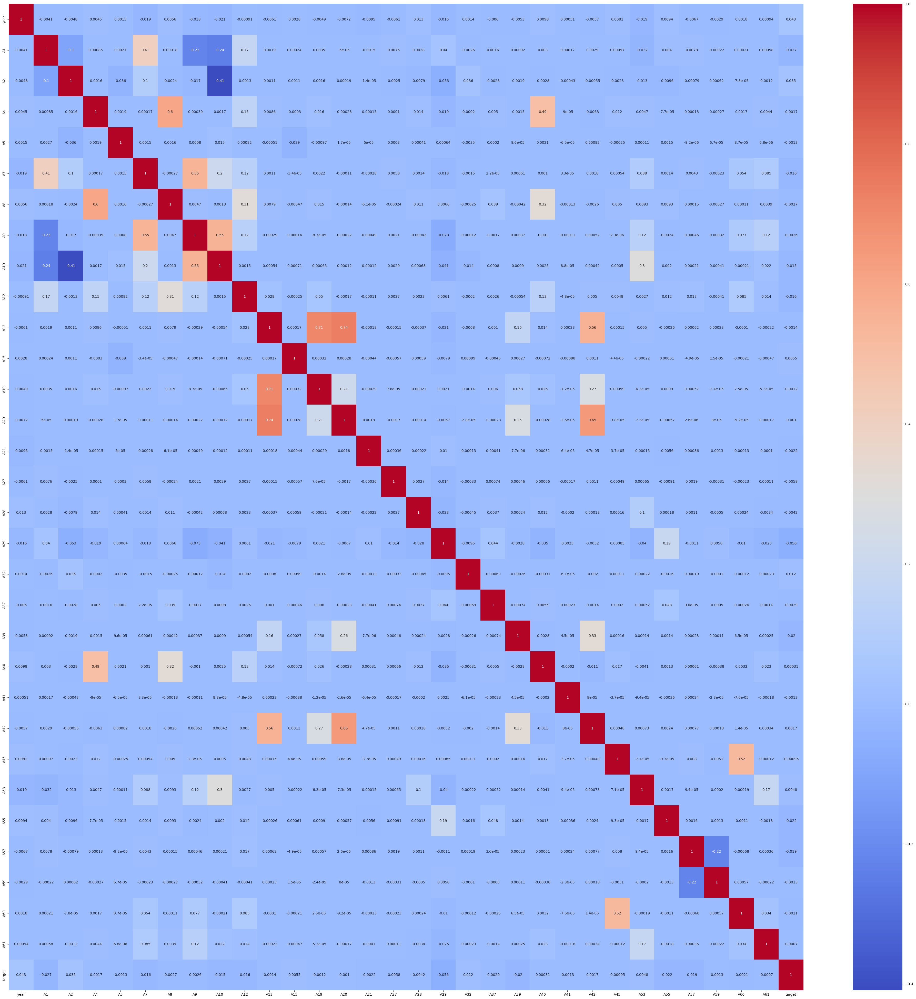

In [80]:
plt.figure(figsize=(50, 50))
sns.heatmap(polish_companies.corr(), annot=True, cmap="coolwarm")
plt.show()

In [81]:
polish_companies.to_csv("data/polish_companies_bankruptcy.csv", index=False)

# raisin

In [82]:
raisin = pd.read_csv("https://raw.githubusercontent.com/Fersoil/logistic_regression/preprocessing_data/data/raisin.csv?token=GHSAT0AAAAAACIBN357CDDDB3U2GZAMDAHKZP3J6BQ")

In [83]:
raisin

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,Extent,Perimeter,Class
0,87524,442.246011,253.291155,0.819738,90546,0.758651,1184.040,Kecimen
1,75166,406.690687,243.032436,0.801805,78789,0.684130,1121.786,Kecimen
2,90856,442.267048,266.328318,0.798354,93717,0.637613,1208.575,Kecimen
3,45928,286.540559,208.760042,0.684989,47336,0.699599,844.162,Kecimen
4,79408,352.190770,290.827533,0.564011,81463,0.792772,1073.251,Kecimen
...,...,...,...,...,...,...,...,...
895,83248,430.077308,247.838695,0.817263,85839,0.668793,1129.072,Besni
896,87350,440.735698,259.293149,0.808629,90899,0.636476,1214.252,Besni
897,99657,431.706981,298.837323,0.721684,106264,0.741099,1292.828,Besni
898,93523,476.344094,254.176054,0.845739,97653,0.658798,1258.548,Besni


In [86]:
raisin["target"] = raisin["Class"].map({"Kecimen": 1, "Besni": 0})
raisin.drop(columns=["Class"], inplace=True)

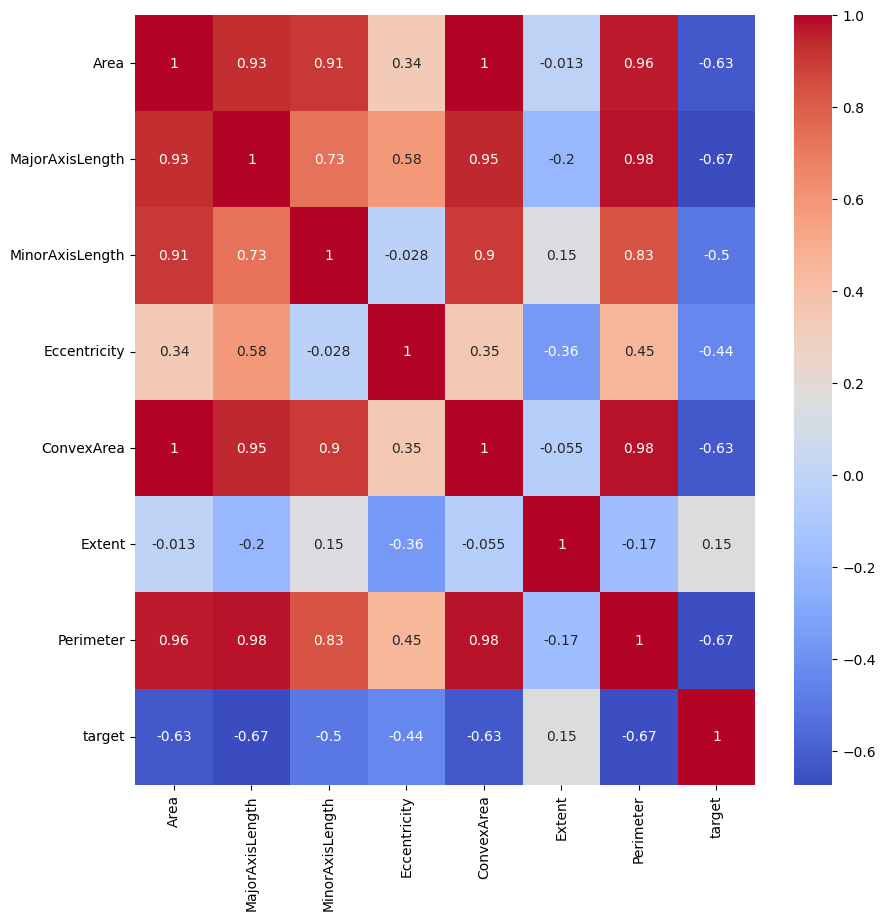

In [87]:
plt.figure(figsize=(10, 10))
sns.heatmap(raisin.corr(), annot=True, cmap="coolwarm")
plt.show()

In [88]:
raisin = remove_collinear_features(raisin, threshold=0.8)

Removed Columns {'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'ConvexArea'}


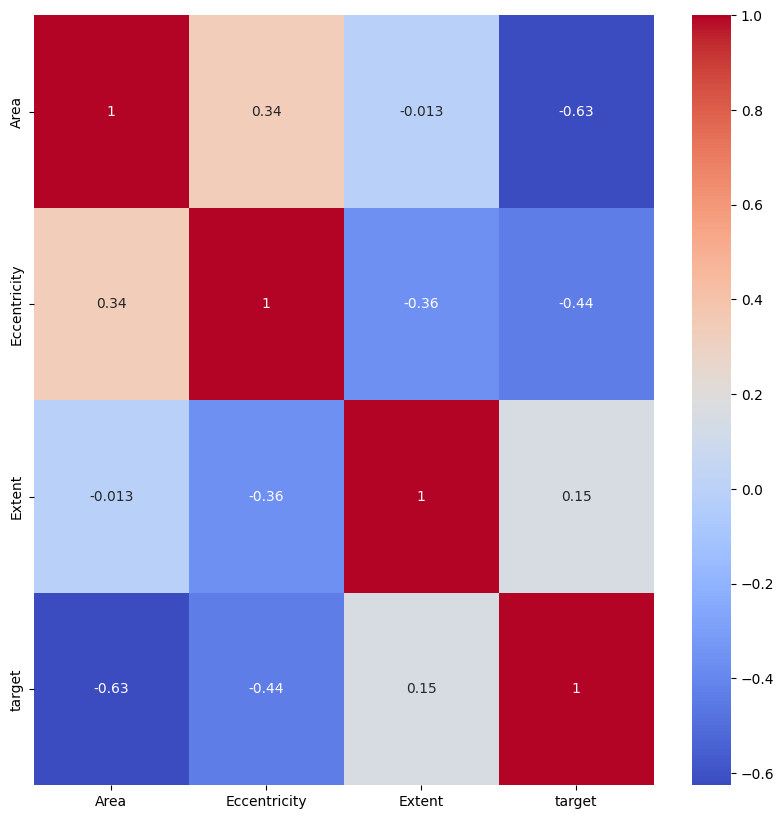

In [89]:
plt.figure(figsize=(10, 10))
sns.heatmap(raisin.corr(), annot=True, cmap="coolwarm")
plt.show()

In [90]:
raisin.to_csv("data/raisin.csv", index=False)

# rice 

In [108]:
rice = pd.read_csv(
    "https://raw.githubusercontent.com/Fersoil/logistic_regression/preprocessing_data/data/rice.csv?token=GHSAT0AAAAAACIBN357IQ47LOHUCZHD5PFWZP3KBNA"
)

In [109]:
rice

,Area,Perimeter,Major_Axis_Length,Minor_Axis_Length,Eccentricity,Convex_Area,Extent,Class
0,15231,525.578979,229.749878,85.093788,0.928882,15617,0.572896,Cammeo
1,14656,494.311005,206.020065,91.730972,0.895405,15072,0.615436,Cammeo
2,14634,501.122009,214.106781,87.768288,0.912118,14954,0.693259,Cammeo
3,13176,458.342987,193.337387,87.448395,0.891861,13368,0.640669,Cammeo
4,14688,507.166992,211.743378,89.312454,0.906691,15262,0.646024,Cammeo
...,...,...,...,...,...,...,...,...
3805,11441,415.858002,170.486771,85.756592,0.864280,11628,0.681012,Osmancik
3806,11625,421.390015,167.714798,89.462570,0.845850,11904,0.694279,Osmancik
3807,12437,442.498993,183.572922,86.801979,0.881144,12645,0.626739,Osmancik
3808,9882,392.296997,161.193985,78.210480,0.874406,10097,0.659064,Osmancik


In [110]:
rice["target"] = rice["Class"].map({"Cammeo": 1, "Osmancik": 0})
rice.drop(columns=["Class"], inplace=True)

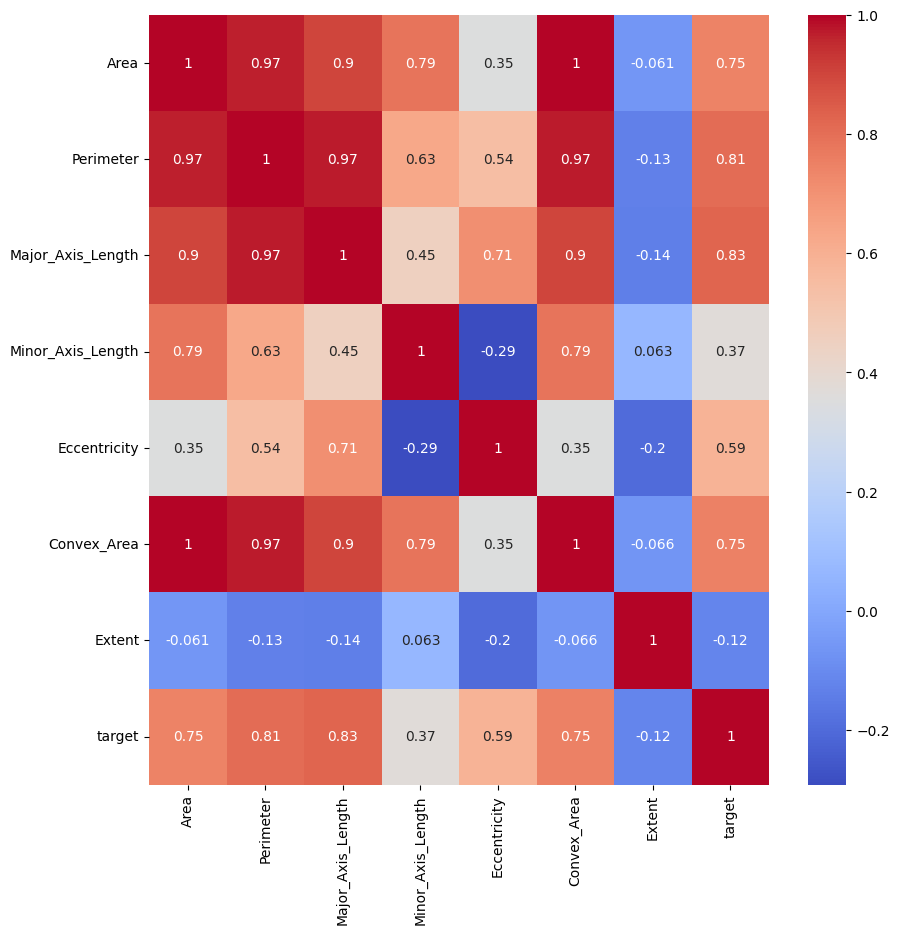

In [111]:
plt.figure(figsize=(10, 10))
sns.heatmap(rice.corr(), annot=True, cmap="coolwarm")
plt.show()

In [112]:
rice = rice.drop(columns=["Convex_Area", "Perimeter"])

In [114]:
rice = rice.drop(columns=["Area"])

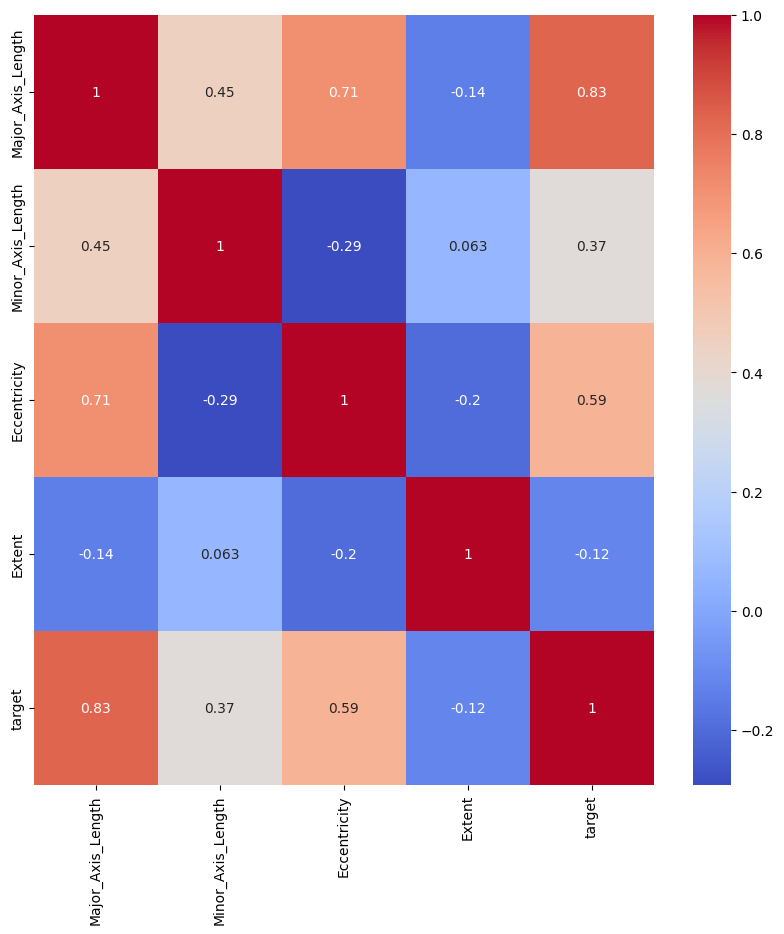

In [115]:
plt.figure(figsize=(10, 10))
sns.heatmap(rice.corr(), annot=True, cmap="coolwarm")
plt.show()

In [116]:
rice.to_csv("data/rice.csv", index=False)